In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import torch
import torch.optim as optim
from torchvision import models
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

##  <font color=SlateBlue>Clorization Net</font> ##

In [ ]:
class ColNet(nn.Module):
    def __init__(self, BIAS = True, BATCHMOM = 0.1):
      super(ColNet, self).__init__()

      self.model1 = nn.Sequential(nn.Conv2d(in_channels=4, out_channels=64, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),  
                                    nn.ReLU(True), 
                                    nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.BatchNorm2d(64, momentum= BATCHMOM))

      self.model2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),  
                                    nn.ReLU(True), 
                                    nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.BatchNorm2d(128, momentum= BATCHMOM))

      self.model3 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=256, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),  
                                    nn.ReLU(True), 
                                    nn.Conv2d(in_channels=256, out_channels=256, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.Conv2d(in_channels=256, out_channels=256, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.BatchNorm2d(256, momentum= BATCHMOM))

      self.model4 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=512, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),  
                                    nn.ReLU(True), 
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.BatchNorm2d(512, momentum= BATCHMOM))

      self.model5 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 2, dilation = 2, stride=1, bias = BIAS),  
                                    nn.ReLU(True), 
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 2, dilation = 2, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 2, dilation = 2, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.BatchNorm2d(512, momentum= BATCHMOM))
  
      self.model6 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 2, dilation = 2, stride=1, bias = BIAS),  
                                    nn.ReLU(True), 
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 2, dilation = 2, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 2, dilation = 2, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.BatchNorm2d(512, momentum= BATCHMOM))
      
      self.model7 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),  
                                    nn.ReLU(True), 
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                    nn.ReLU(True),
                                    nn.BatchNorm2d(512, momentum= BATCHMOM))
      
      self.model8up = nn.Sequential(nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=(4,4), padding = 1, stride=2, bias = BIAS))
      self.model8 = nn.Sequential(nn.ReLU(True), 
                                  nn.Conv2d(in_channels=256, out_channels=256, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                  nn.ReLU(True),
                                  nn.Conv2d(in_channels=256, out_channels=256, kernel_size=(3,3), padding = 1, stride=1, bias = BIAS),
                                  nn.ReLU(True),
                                  nn.BatchNorm2d(256, momentum= BATCHMOM))
      
      self.model9up = nn.Sequential(nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=(4,4), padding = 1, stride=2))
      self.model9 = nn.Sequential(nn.ReLU(True), 
                                  nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3,3), padding = 1, stride=1),
                                  nn.ReLU(True),
                                  nn.BatchNorm2d(128, momentum= BATCHMOM))

      self.model10up = nn.Sequential(nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=(4,4), padding = 1, stride=2))
      self.model10 = nn.Sequential(nn.ReLU(True), 
                                    nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3,3), padding = 1, dilation = 1, stride=1),
                                    nn.LeakyReLU(negative_slope=.2))
      
      self.model3short8 = nn.Sequential(nn.Conv2d(256, 256, kernel_size=(3,3), stride=1, padding=1, bias=BIAS))
      self.model2short9 = nn.Sequential(nn.Conv2d(128, 128, kernel_size=(3,3), stride=1, padding=1, bias=BIAS))
      self.model1short10 = nn.Sequential(nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, bias=BIAS))

      self.model_class = nn.Sequential(nn.Conv2d(256, 529, kernel_size=1, padding=0, dilation=1, stride=1, bias=True))
      self.model_out = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=2, kernel_size=(1,1), padding = 0, dilation = 1, stride=1),  
                                  nn.Tanh())


    def forward(self, channel_l, channel_ab = None, mask = None):
      if mask == None:
        mask = torch.zeros(channel_l.shape).cuda()
    
      # Initial Colorization
      if channel_ab == None:
        channel_ab = torch.zeros(channel_l.shape).cuda()
        channel_ab = torch.cat((channel_ab, channel_ab), dim = 1).cuda()

      input = torch.cat((self.scaleChannel_l(channel_l, normalize = True), self.scaleChannel_ab(channel_ab, normalize = True),mask),dim=1)
      x1 = self.model1(input)
      
      # Halved spatially, Doubled feature
      x2 = self.model2(x1[:,:,::2,::2])
      x3 = self.model3(x2[:,:,::2,::2])
      x4 = self.model4(x3[:,:,::2,::2])

      # Dilated Convs
      x5 = self.model5(x4)
      x6 = self.model6(x5)
      x7 = self.model7(x6)

      # Spatial Res recovered, Halved Feature
      x8 = self.model8up(x7) + self.model3short8(x3)
      x8 = self.model8(x8)

      x9 = self.model9up(x8) + self.model2short9(x2)
      x9 = self.model9(x9) 

      x10 = self.model10up(x9) + self.model1short10(x1)
      x10 = self.model10(x10)

      # Classifier for each pix
      out = self.model_out(x10)

      return self.scaleChannel_ab(out, normalize = False)

    def scaleChannel_l(self, channel_l, normalize):
      avg = 50.0
      rng = 100.0

      if normalize:
        channel =  (channel_l - avg)/rng
      else:
        channel =  channel_l*rng + avg
      
      return channel
      

    def scaleChannel_ab(self, channel_ab, normalize):
      rng = 110

      if normalize:
        channel =  channel_ab/rng
      else:
        channel = channel_ab*rng
      
      return channel

In [ ]:
def produceMask(maskProb, maskShape):
  return (torch.FloatTensor(maskShape).uniform_() > maskProb).int()


##  <font color=SlateBlue>Transfer Sub-net</font> ##

In [ ]:
class TransferSubNetEncoder(nn.Module):
  def __init__(self, requires_grad=False):
    super(TransferSubNetEncoder, self).__init__()

    vgg = self.modifyVGG()

    vgg_layers = list(vgg.children())
    self.slice1 = nn.Sequential(*vgg_layers[0:6])  
    self.slice2 = nn.Sequential(*vgg_layers[6:13])  
    self.slice3 = nn.Sequential(*vgg_layers[13:26])  
    self.slice4 = nn.Sequential(*vgg_layers[26:30])  

  def modifyVGG(self):
    vgg = models.vgg19_bn(pretrained=True, progress=False).features

    # Freeze all VGG parameters since we’re only optimizing the target image
    for param in vgg.parameters():
      param.requires_grad_(False)

    for i, layer in vgg.named_children():
      if isinstance(layer, torch.nn.MaxPool2d):
        vgg[int(i)] = nn.AvgPool2d(kernel_size=2, stride=2, padding=0)

    return vgg

  def forward(self, input):
    out1 = self.slice1(input)
    out2 = self.slice2(out1)
    out3 = self.slice3(out2)
    out4 = self.slice4(out3)
    return {'Slice1':out1, 'Slice2':out2, 'Slice3':out3, 'Encoder':out4}


In [ ]:
class ConvBachNormReLU(nn.Module):
  def __init__(self, in_channels_size, out_channels_size, 
               kernel_size=(3, 3), stride_size=(1, 1), padding_size=(1, 1)):
    super(ConvBachNormReLU, self).__init__()

    conv_layer = nn.Conv2d(in_channels=in_channels_size,
                           out_channels=out_channels_size,
                           kernel_size=kernel_size,
                           stride=stride_size,
                           padding=padding_size)
    
    bn_layer = nn.BatchNorm2d(out_channels_size, 
                              eps=1e-05, 
                              momentum=0.1, 
                              affine=True, 
                              track_running_stats=True)

    activation_layer = nn.ReLU(inplace=True)

    self.unit = nn.Sequential(conv_layer, 
                              bn_layer, 
                              activation_layer)
      
  def forward(self, input): return self.unit(input)

In [ ]:
class TransferSubNetDecoder(nn.Module):
  def __init__(self):
    super(TransferSubNetDecoder, self).__init__()

    self.slice_4 = nn.Sequential(ConvBachNormReLU(512, 256),
                                 nn.Upsample(scale_factor=2, mode='nearest'))
    
    self.slice_3 = nn.Sequential(ConvBachNormReLU(256, 256),
                                 ConvBachNormReLU(256, 256),
                                 ConvBachNormReLU(256, 256),
                                 ConvBachNormReLU(256, 128),
                                 nn.Upsample(scale_factor=2, mode='nearest'))
    
    self.slice_2 = nn.Sequential(ConvBachNormReLU(128, 128),
                                 ConvBachNormReLU(128, 64),
                                 nn.Upsample(scale_factor=2, mode='nearest'))
    
    self.slice_1 = nn.Sequential(ConvBachNormReLU(64, 64),
                                 ConvBachNormReLU(64, 3))

  def forward(self, encoder_outputs):
    out4 = self.slice_4(encoder_outputs['Encoder'])
    
    in3 = out4 + encoder_outputs['Slice3']
    out3 = self.slice_3(in3)

    in2 = out3 + encoder_outputs['Slice2']
    out2 = self.slice_2(in2)

    in1 = out2 + encoder_outputs['Slice1']
    return self.slice_1(in1)

In [ ]:
def calc_mean_std(features, eps=1e-5):
  # eps is a small value added to the variance to avoid divide-by-zero.
  size = features.size()
  assert (len(size) == 4)
  N, C = size[:2]

  features_var = features.view(N, C, -1).var(dim=2) + eps
  features_std = features_var.sqrt().view(N, C, 1, 1)

  features_mean = features.view(N, C, -1).mean(dim=2).view(N, C, 1, 1)

  return features_mean, features_std

def AdaIN(content_features, style_features):
  assert (content_features.size()[:2] == style_features.size()[:2])
  size = content_features.size()

  style_mean, style_std = calc_mean_std(style_features)
  content_mean, content_std = calc_mean_std(content_features)

  normalized_features = (content_features - content_mean.expand(size)) / content_std.expand(size)

  return normalized_features * style_std.expand(size) + style_mean.expand(size)

In [ ]:
class TransferSubNet(nn.Module):
  def __init__(self):
    super(TransferSubNet, self).__init__()

    self.encoder = TransferSubNetEncoder()
    self.decoder = TransferSubNetDecoder()

  def forward(self, R, T_prime):
    style_features = self.encoder(R)
    content_features = self.encoder(T_prime)

    decoder_in = AdaIN(content_features['Encoder'], style_features['Encoder'])
    
    return self.decoder({'Slice1':content_features['Slice1'], 'Slice2':content_features['Slice2'], 'Slice3':content_features['Slice3'], 'Encoder':decoder_in})


##  <font color=SlateBlue>Full Net</font> ##

In [ ]:
import torch.utils.model_zoo as model_zoo

In [ ]:
class FullNet(nn.Module):
  def __init__(self):
    super(FullNet, self).__init__()
    self.colNet = ColNet().cuda().double()
    self.colNet.load_state_dict(model_zoo.load_url('https://colorizers.s3.us-east-2.amazonaws.com/siggraph17-df00044c.pth', map_location='cuda',check_hash=True))
    self.colNet = self.colNet.cuda().double()

    self.transNet = torch.load("./gdrive/MyDrive/Deep/TransferSubNet.pth.tar").cuda().double()
    
  def forward(self, inputImg, refImg, maskB, T_AB_none):
    img_T_prime = self.colNet(channel_l = inputImg, channel_ab = None,   mask = None)
    img_T_prime = torch.cat((inputImg, img_T_prime), dim = 1)

    img_T_prime = img_T_prime.detach().cpu().numpy()
    for i in range(len(img_T_prime)):
      img_T_prime[i] = np.transpose(color.lab2rgb(np.transpose(img_T_prime[i], (1,2,0))), (2,0,1))
    img_T_prime = torch.tensor(img_T_prime).cuda()

    img_T_ab = self.transNet(refImg, img_T_prime)

    img_T_ab = img_T_ab.detach().cpu().numpy()

    for i in range(len(img_T_ab)):
      img_T_ab[i] = np.transpose(color.rgb2lab(np.transpose(img_T_ab[i], (1,2,0))), (2,0,1))
    
    img_T_ab = torch.tensor(img_T_ab).cuda()

    img_T_ab = img_T_ab[:, 1:, : ,:]
    
    if T_AB_none:
      img_T_ab = None
      maskB = None
      
    outPut = self.colNet(channel_l = inputImg,  channel_ab = img_T_ab, mask = maskB)
    outPut = torch.cat((inputImg, outPut), dim = 1)

    return outPut, img_T_prime



##  <font color=SlateBlue>Loading data</font> ##

In [ ]:
def rgbGray(img):
  R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]
  imgGray = 0.2989 * R + 0.5870 * G + 0.1140 * B
  return imgGray

def showResultsLAB(epoch_, originalImg, refrence, predictedResult, predColNet, ingnorRef):
  
  origImg = color.lab2rgb(np.transpose(originalImg, (2,1,0)))
  refrence = color.lab2rgb(np.transpose(refrence, (2,1,0)))
  predictedResult = color.lab2rgb(np.transpose(predictedResult, (2,1,0)))

  origImg = rgbGray(np.transpose(origImg, (1,0,2)))

  fig, axs = plt.subplots(1, 4, figsize=(15,5))

  if ingnorRef:
    fig.suptitle('Reference Ignored')
  else:
    fig.suptitle('Reference Noted')

  axs[0].imshow(origImg,  cmap='gray')
  axs[0].set_title('Input Image')
  axs[0].set_yticks([])
  axs[0].set_xticks([])
  
  axs[1].imshow(np.transpose(refrence, (1,0,2)))
  axs[1].set_title('Reference  Image')
  axs[1].set_yticks([])
  axs[1].set_xticks([])

  axs[2].imshow(np.transpose(predColNet, (1,2,0)))
  axs[2].set_title('Colorization Sub-Net')
  axs[2].set_yticks([])
  axs[2].set_xticks([])

  axs[3].imshow(np.transpose(predictedResult, (1,0,2)))
  axs[3].set_title('Full Network ')
  axs[3].set_yticks([])
  axs[3].set_xticks([])

  plt.show()
  plt.close()

In [ ]:
batch_size = 4
num_epochs = 5

In [ ]:
%run ./gdrive/MyDrive/Deep/data_prep.ipynb
dp = Data_prep()
X_train, X_val, Y_train, Y_val = dp.load_data()

 data_prep.ipynb	      'Transfer_Sub_Net_AmirMod (1).ipynb'
 Deep000412_Pretrained.ipynb   TransferSubNet_copy.pth.tar
 Final_Part_000502.ipynb       Transfer_Sub_Net.ipynb
 FNet_checkpoint.pth.tar       Transfer_Sub_Net_Modified.ipynb
 instances_train2017.json      TransferSubNet.pth.tar
 train.ipynb		       transNet_checkpoint.pth.tar
gdrive	sample_data  train2017	train2017.zip  train2017.zip.1
Loading JSON file ....
Loading class #36
Loading class #42
Loading class #24
Loading class #35
Loading images ...


In [ ]:
trans = T.Compose([
          T.Normalize([0.0, 0.0, 0.0], [1, 1, 1])
      ])

In [ ]:
train_data = COCODataset_FullTrain(X_train, Y_train, transform = trans)
val_data = COCODataset_FullTrain(X_val, Y_val, transform = trans)

train_loader = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(dataset=val_data, batch_size=batch_size, shuffle=True)

In [ ]:
dataloader_iterator = iter(val_loader)
validation_sentences = next(dataloader_iterator)
inputImg, refImg, img_gt = validation_sentences

In [ ]:
inputImg.unsqueeze(1).shape, refImg.shape, img_gt.shape

(torch.Size([4, 1, 256, 256]),
 torch.Size([4, 3, 256, 256]),
 torch.Size([4, 3, 256, 256]))

In [ ]:
print(len(train_data))

4929


##  <font color=SlateBlue>Full Net Train</font> ##

In [ ]:
criterion = nn.HuberLoss(reduction='mean', delta=1.0)
FNet = FullNet().cuda().double()
optimizer = optim.Adam(FNet.transNet.parameters(), lr =0.00001)
maskProb = 0.99
lamb = 10

Epoch 1 has started......


No handles with labels found to put in legend.


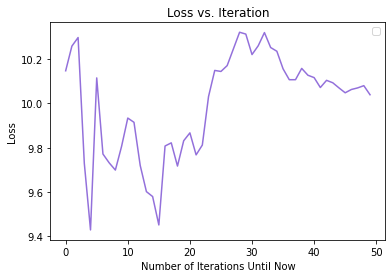

0


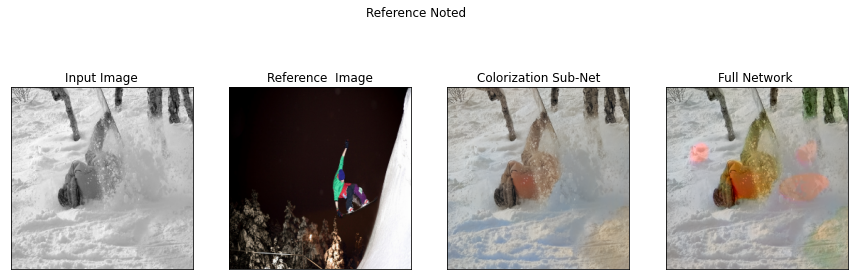

No handles with labels found to put in legend.


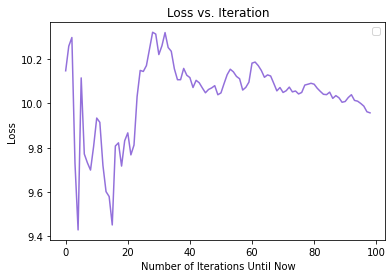

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 28 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


1


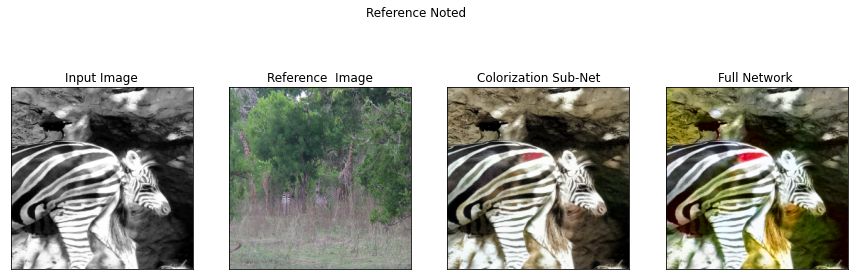

No handles with labels found to put in legend.


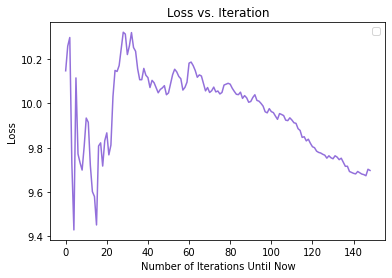

2


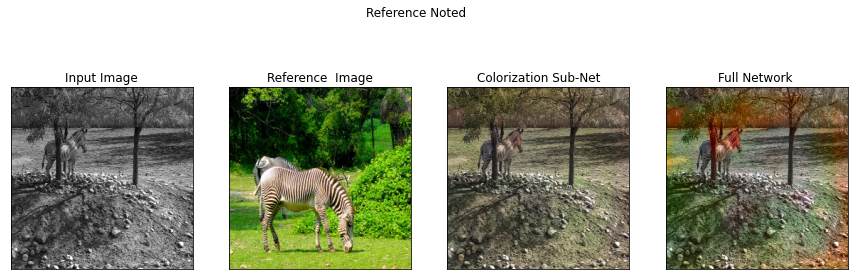

No handles with labels found to put in legend.


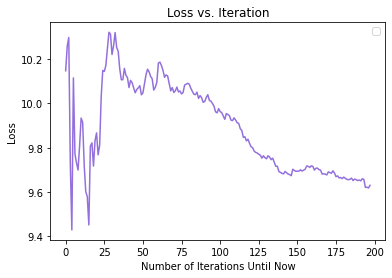

3


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 94 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


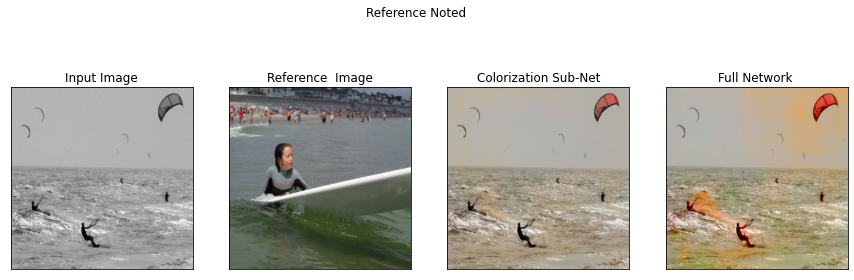

No handles with labels found to put in legend.


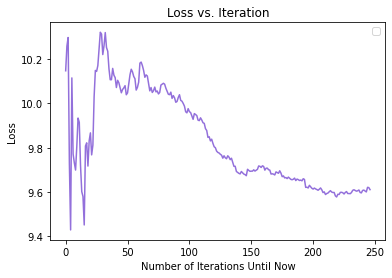

4


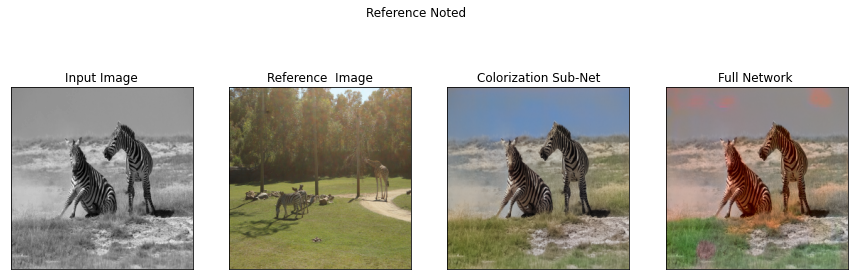

No handles with labels found to put in legend.


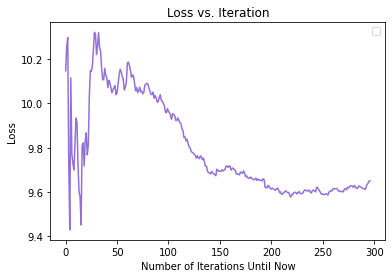

5


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 26 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


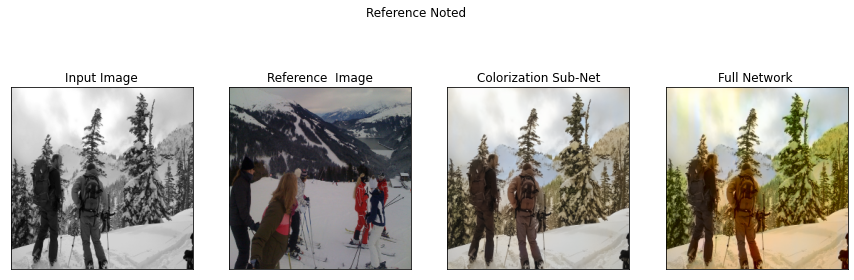

No handles with labels found to put in legend.


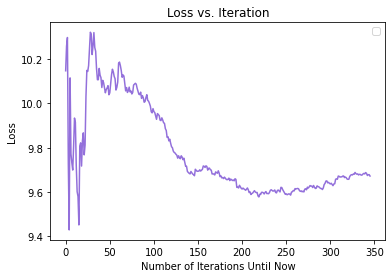

6


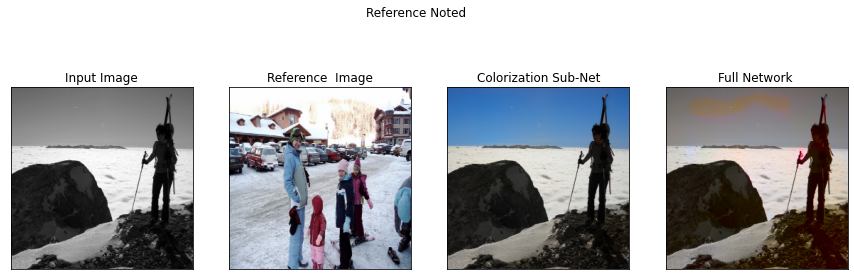

picture problem!
picture problem!


No handles with labels found to put in legend.


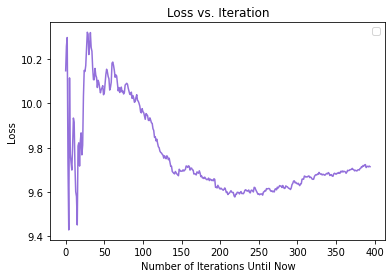

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 2059 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


7


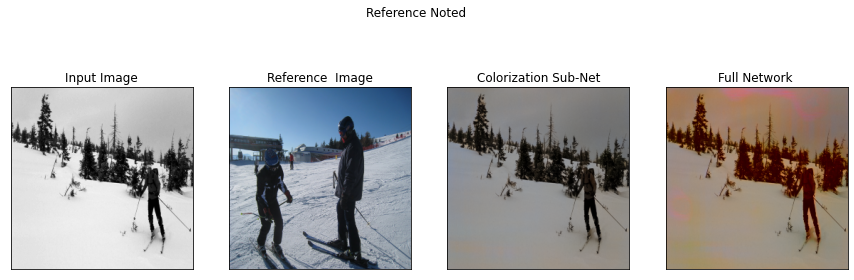

No handles with labels found to put in legend.


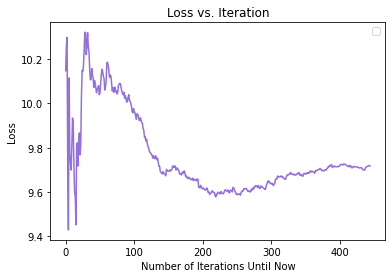

8


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 157 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


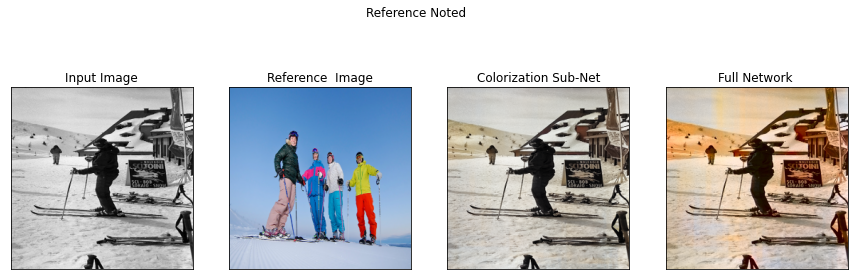

No handles with labels found to put in legend.


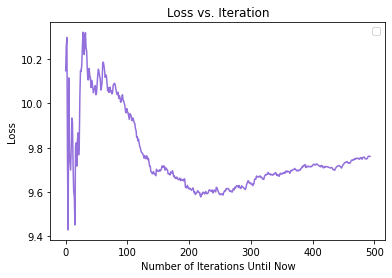

9


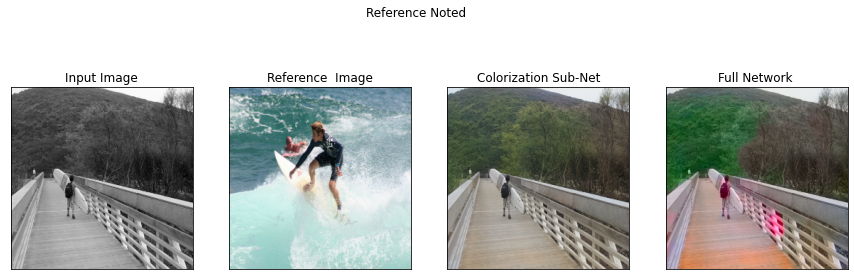

No handles with labels found to put in legend.


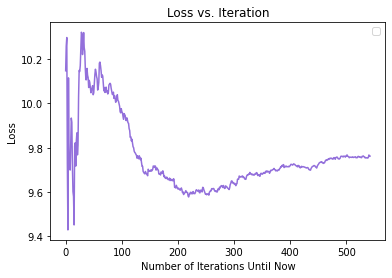

0


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 19 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


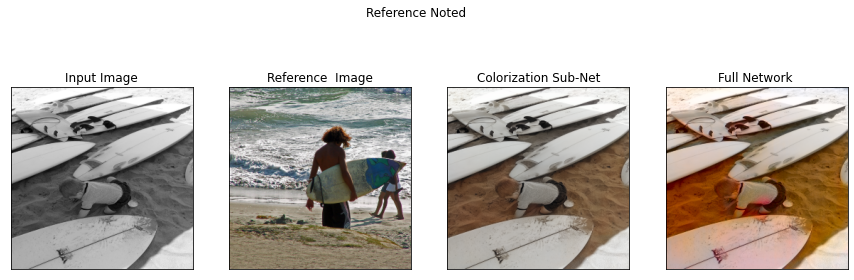

No handles with labels found to put in legend.


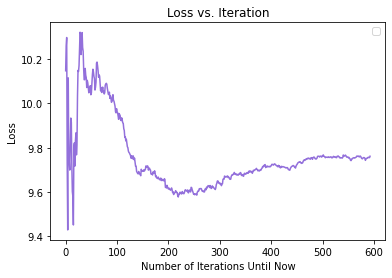

1


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 171 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


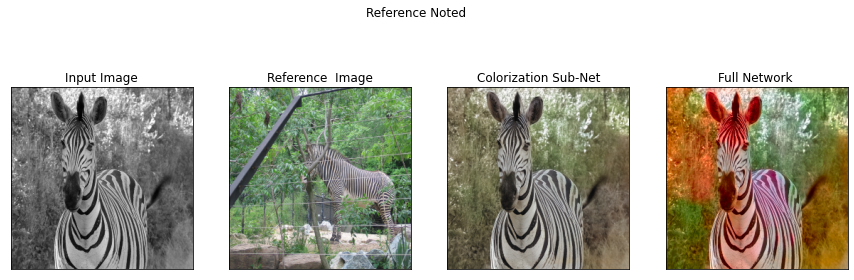

No handles with labels found to put in legend.


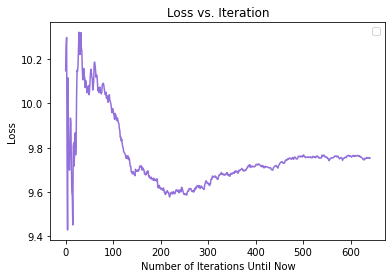

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 69 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


2


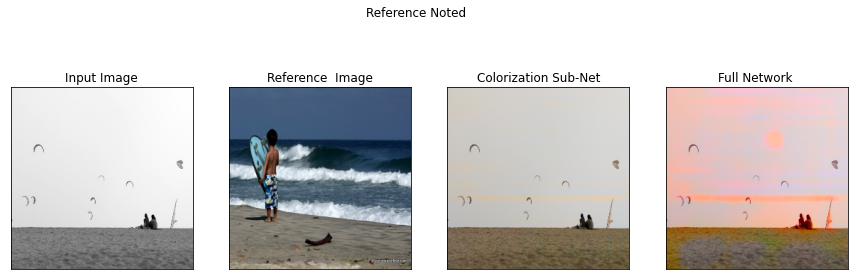

picture problem!


No handles with labels found to put in legend.


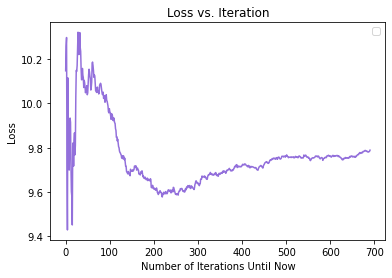

3


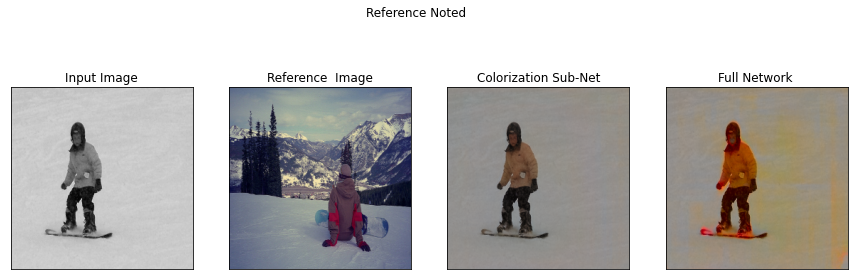

No handles with labels found to put in legend.


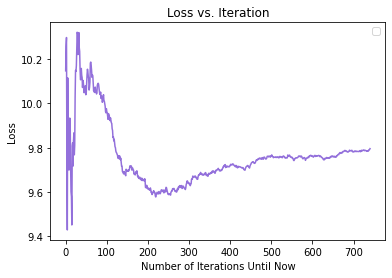

4


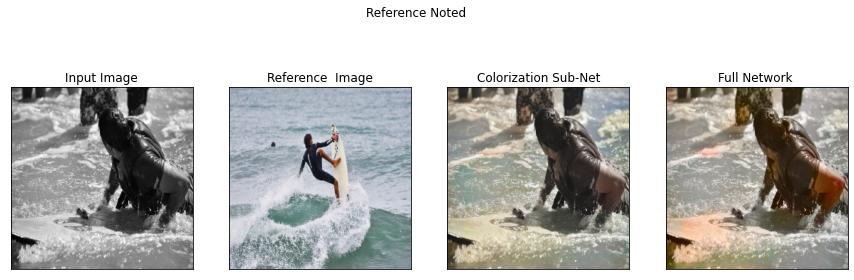

No handles with labels found to put in legend.


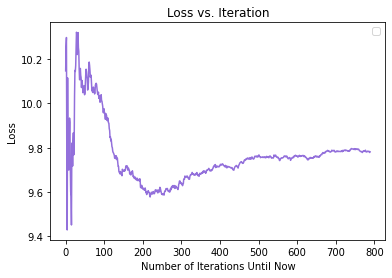

5


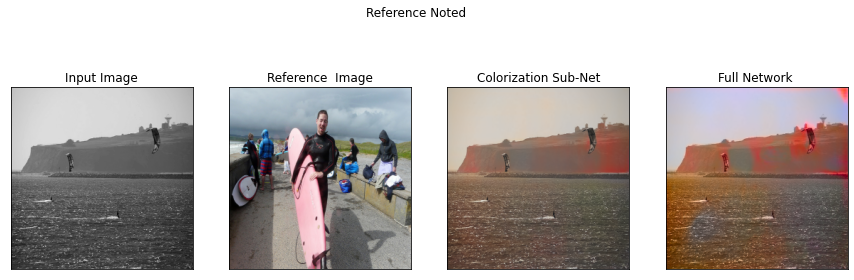

No handles with labels found to put in legend.


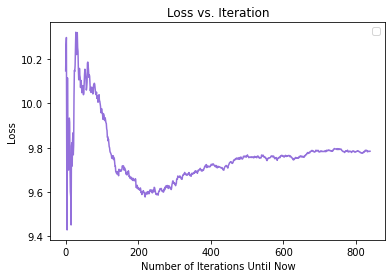

6


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 241 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


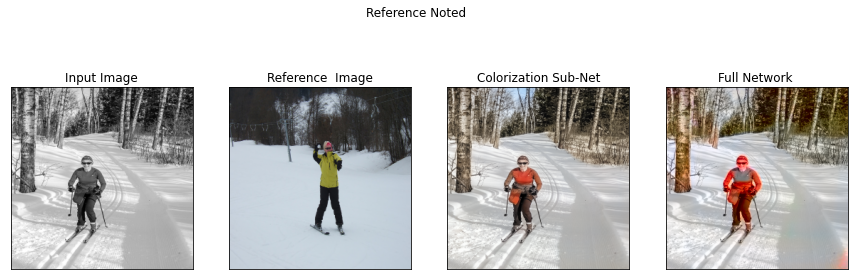

No handles with labels found to put in legend.


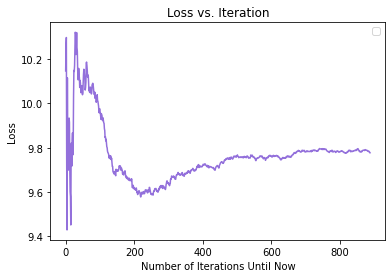

7


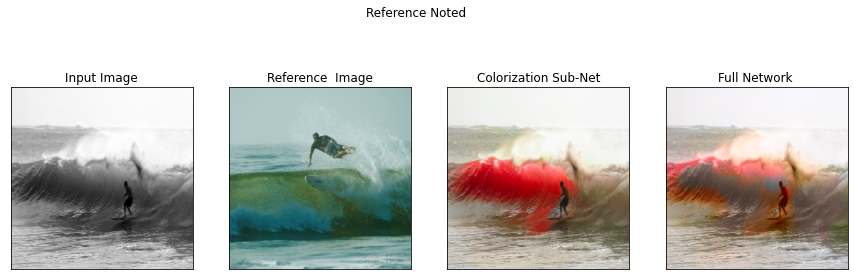

No handles with labels found to put in legend.


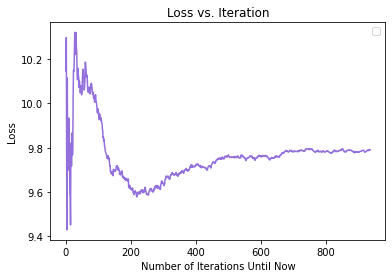

8


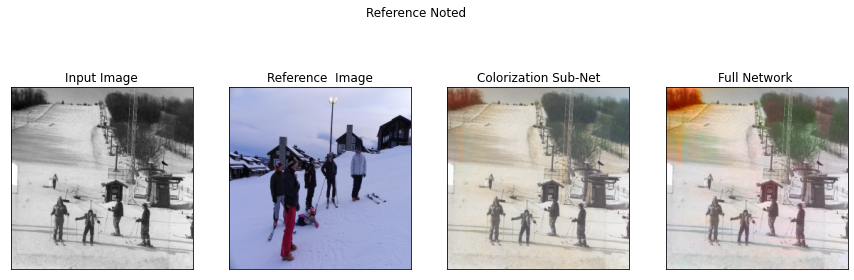

picture problem!


No handles with labels found to put in legend.


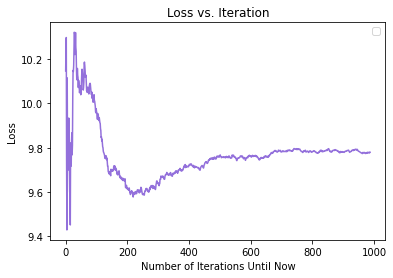

9


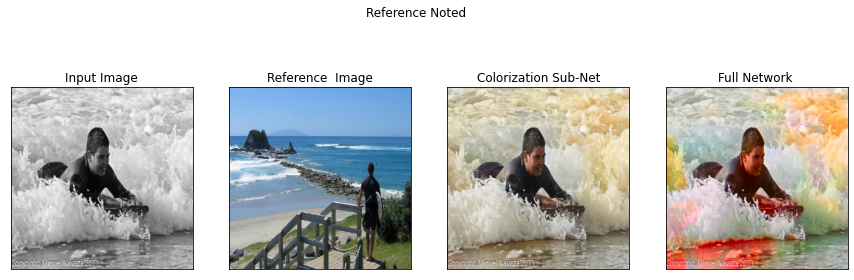

No handles with labels found to put in legend.


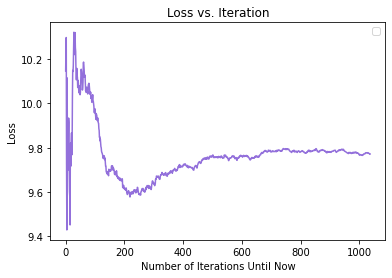

0


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 32 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


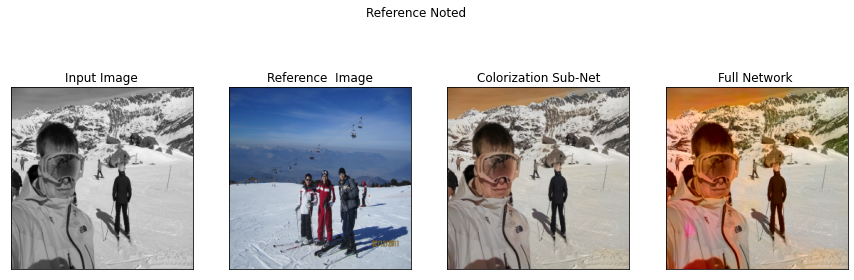

No handles with labels found to put in legend.


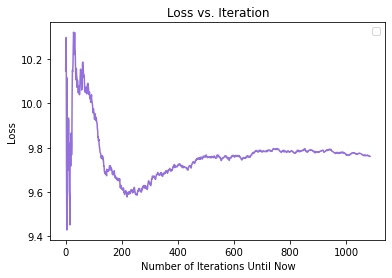

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


1


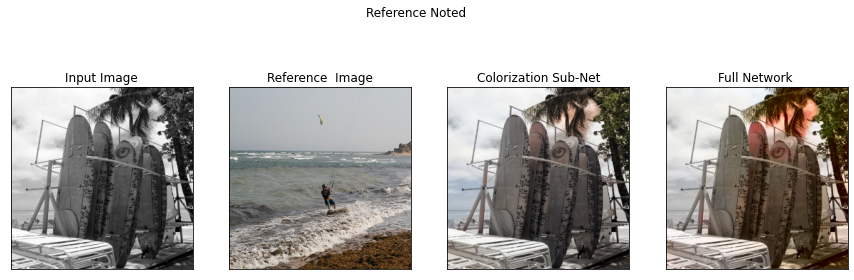

No handles with labels found to put in legend.


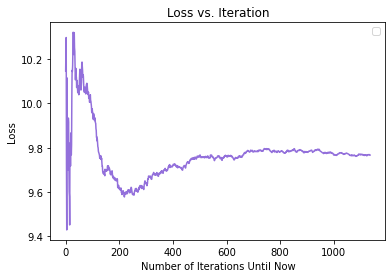

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 612 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


2


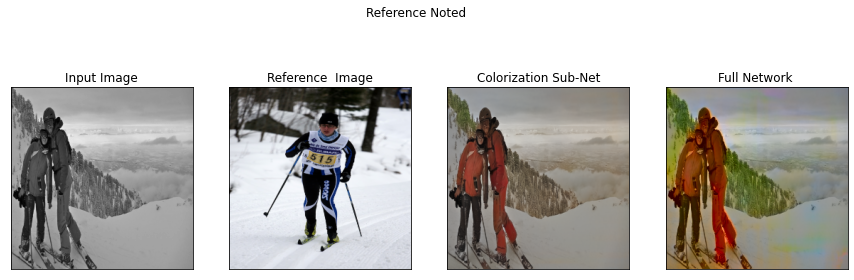

No handles with labels found to put in legend.


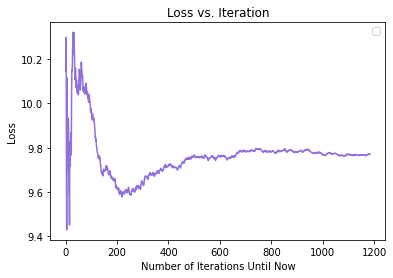

3


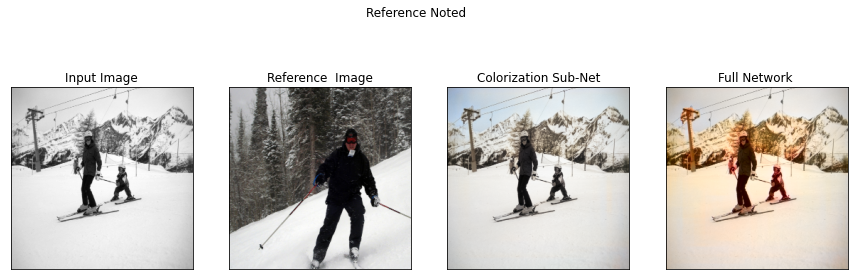

Epoch 2 has started......


No handles with labels found to put in legend.


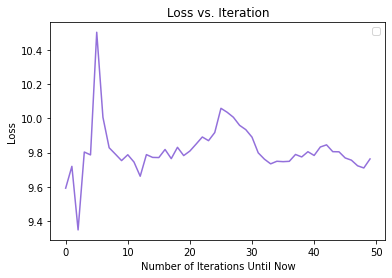

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 44 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


0


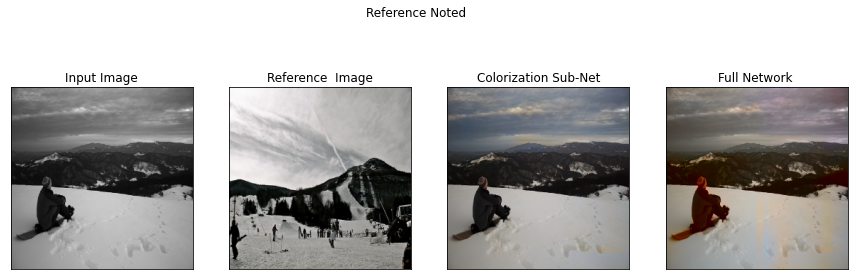

No handles with labels found to put in legend.


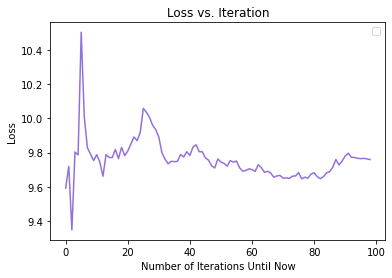

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


1


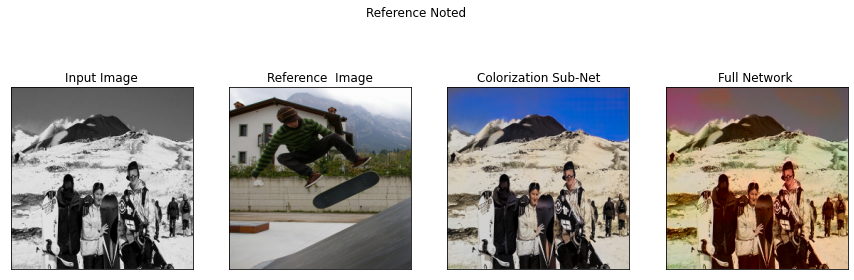

No handles with labels found to put in legend.


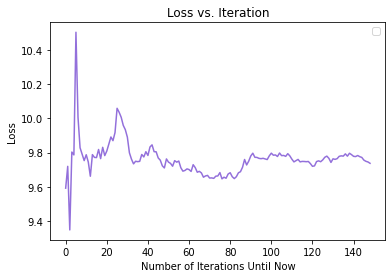

2


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 96 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


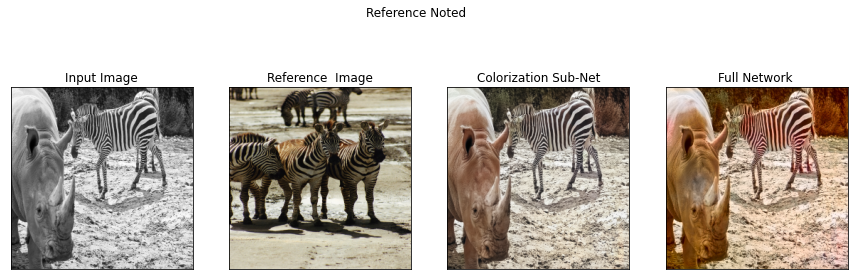

No handles with labels found to put in legend.


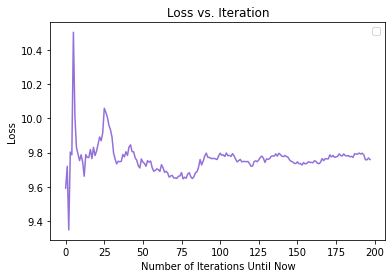

3


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 635 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


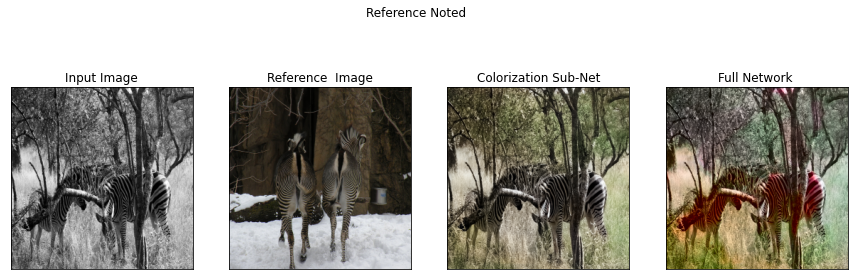

No handles with labels found to put in legend.


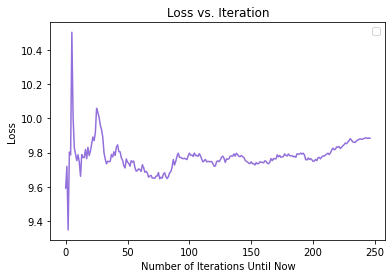

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 488 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


4


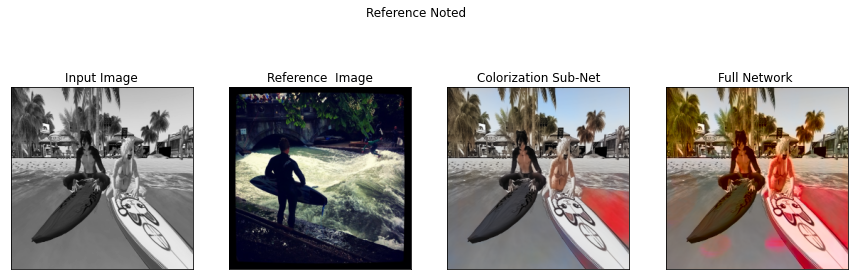

No handles with labels found to put in legend.


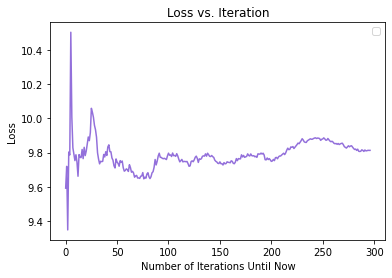

5


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 285 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


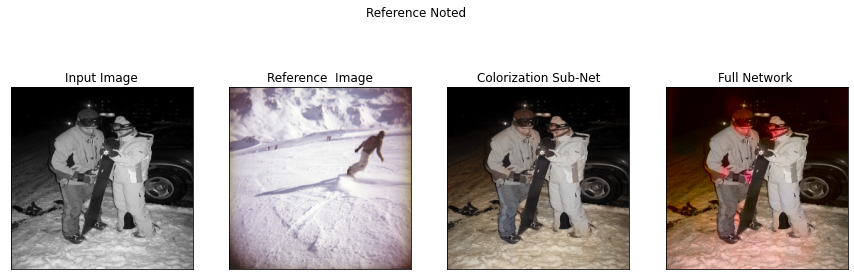

No handles with labels found to put in legend.


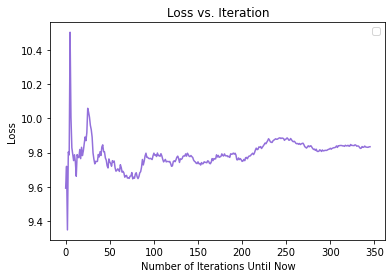

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 92 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


6


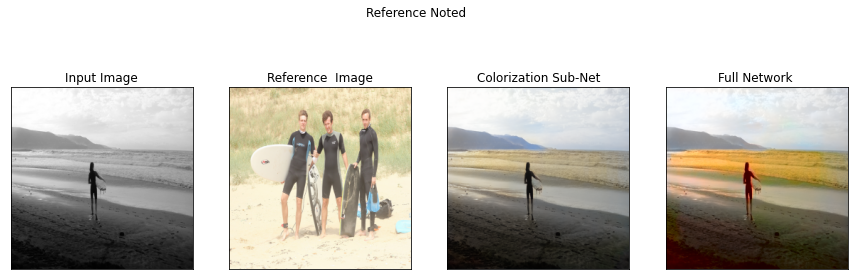

picture problem!


No handles with labels found to put in legend.


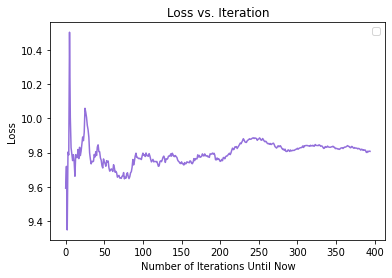

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 563 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


7


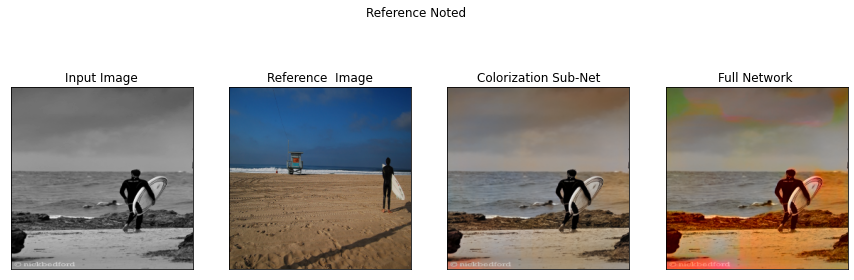

No handles with labels found to put in legend.


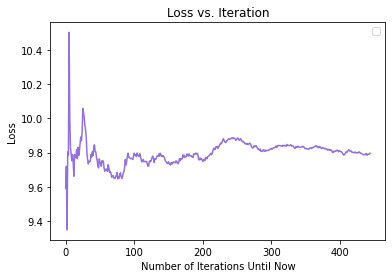

8


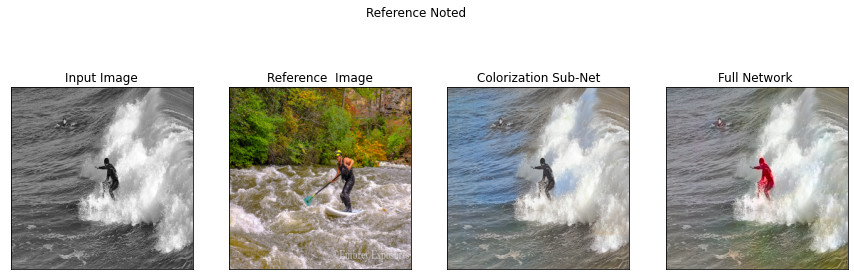

No handles with labels found to put in legend.


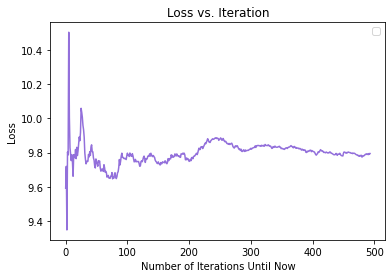

9


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 113 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


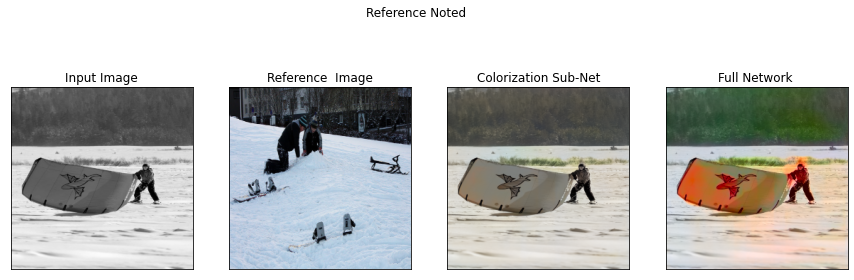

picture problem!


No handles with labels found to put in legend.


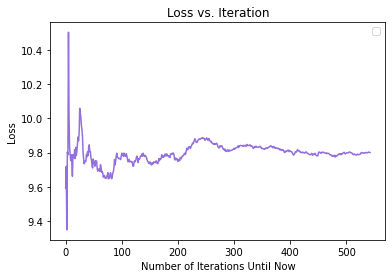

0


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 133 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


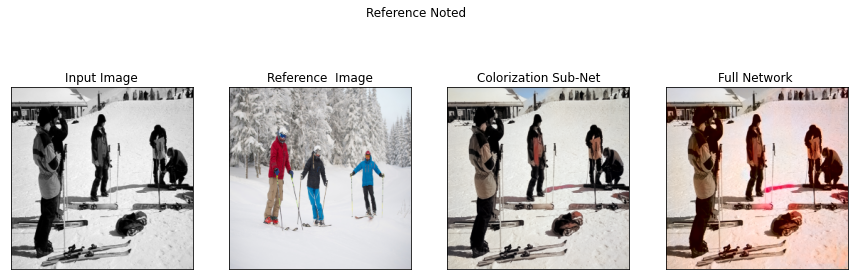

No handles with labels found to put in legend.


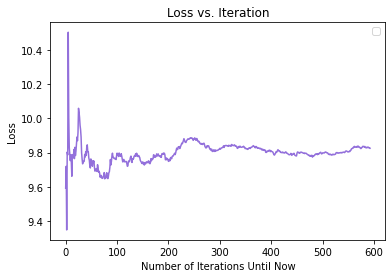

1


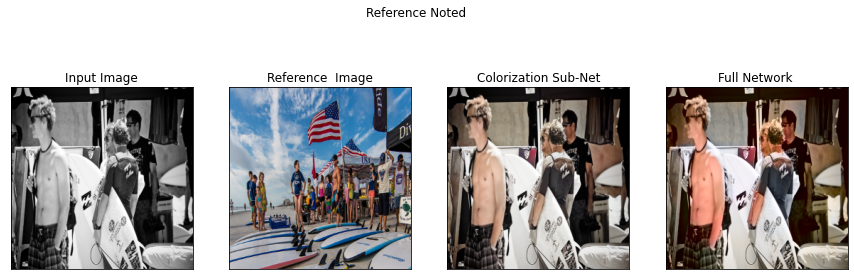

No handles with labels found to put in legend.


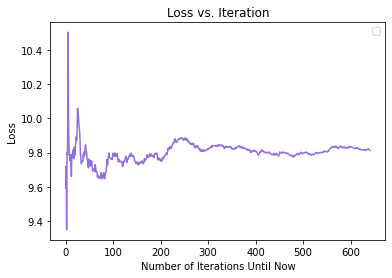

2


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 1198 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


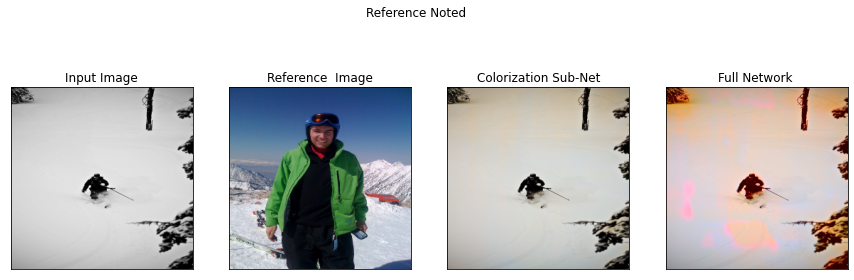

picture problem!


No handles with labels found to put in legend.


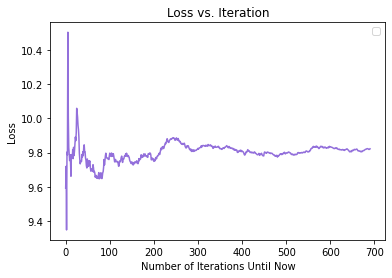

3


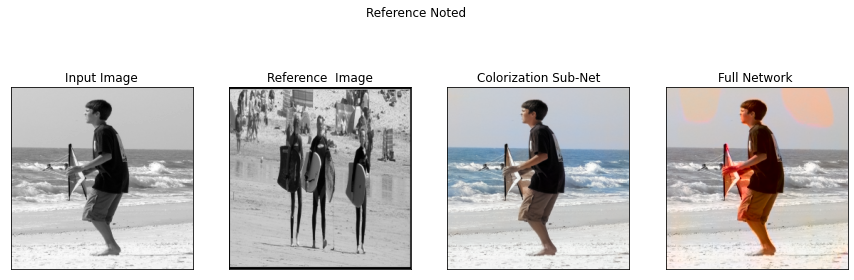

No handles with labels found to put in legend.


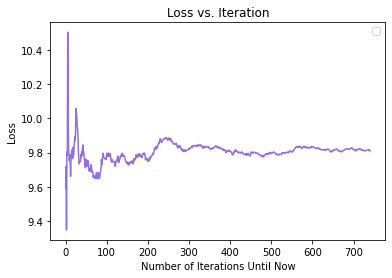

4


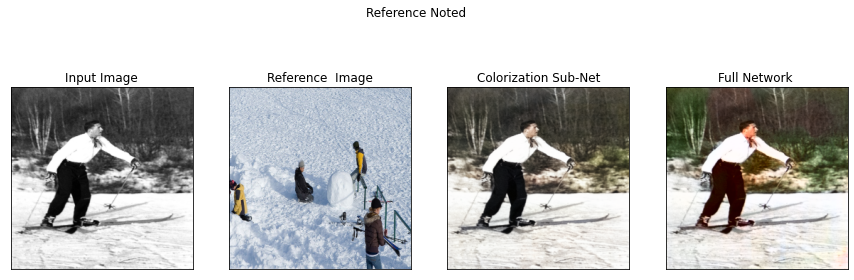

No handles with labels found to put in legend.


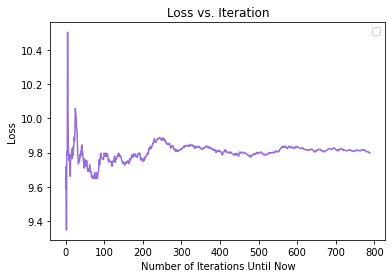

5


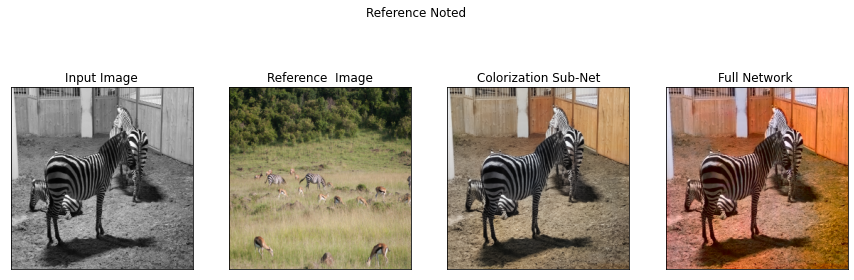

In [ ]:
FNet.train()

for epoch in range(num_epochs):
  print('Epoch %d has started......' %(epoch+1))
  iter_loss = 0
  losses = []
  
  for idx, (inputImg, refImg, img_gt) in enumerate(train_loader):
    inputImg = inputImg.unsqueeze(1)
    inputImg = Variable(inputImg).cuda()
    refImg  = Variable(refImg).cuda()
    img_gt = Variable(img_gt).cuda()
    
    
    maskB =  produceMask(maskProb = maskProb, maskShape = inputImg.shape).cuda()

    if idx % 201 ==200:
      ingnorRef = True
    else:
      ingnorRef = False

    outPut, colOut = FNet(inputImg, refImg, maskB, ingnorRef)

    weightedOut = (1+lamb*maskB)*outPut
    weightedGT = (1+lamb*maskB)*img_gt
    loss = criterion(weightedOut, weightedGT)

    iter_loss += loss.item()
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    torch.save(FNet, "./gdrive/MyDrive/Deep/FNet_checkpoint.pth.tar")

    if not idx%31==30:
      losses.append(iter_loss/(idx+1))

    if idx % 51 ==50:
      plt.plot(losses, color='mediumpurple')
      plt.title('Loss vs. Iteration')
      plt.xlabel('Number of Iterations Until Now')
      plt.ylabel('Loss')
      plt.legend(loc='best')
      plt.show()
    
    if idx % 51 ==50 :
      print(idx%10)
      a = img_gt[0].detach().cpu().numpy()
      b = refImg[0].detach().cpu().numpy()
      c = outPut[0].detach().cpu().numpy()
      d = colOut[0].detach().cpu().numpy()

      showResultsLAB(epoch, a, b, c, d, ingnorRef)
